# Orientation bias from voxel-grid discretization

Quantifies the artefact introduced by marching-cubes surface extraction on a regular voxel grid:
how much do the measured anisotropy index β and principal-axis orientation vary as the same
abstract triaxial ellipsoid is presented at different orientations relative to the grid?

**Shape**: triaxial ellipsoid with semi-axes A=10, B=6, C=4 (arbitrary distance units).

**Rotation protocols**
- **rot_z**: ellipsoid swept through 12 orientations (0°–165°, 15° steps) **in the axis-0/axis-1 plane** (rotation around array axis-2 = pykarambola z-axis).
- **rot_y**: same 12 orientations **in the axis-0/axis-2 plane** (rotation around array axis-1 = pykarambola y-axis).

**Resolution sweep**: 12 voxel sizes expressed as fractions of A (A/3 coarse → A/100 fine).

**All six rank-2 Minkowski tensors** are evaluated:
- Position tensors: `w020`, `w120`, `w220`, `w320`
- Normal tensors: `w102`, `w202`

For all tensors the fine-resolution (A/100, angle=0) measurement is shown as a dotted reference.

Also demonstrates that scalar Minkowski functionals (w000–w300) converge asymptotically with
resolution without orientation-dependent bias, whereas rank-2 tensor β values carry an
orientation-dependent spread that persists at coarse resolutions.

In [15]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import platform
import warnings
import trimesh as tm
from skimage.measure import marching_cubes

import pykarambola

print(f'pykarambola : {pykarambola.__version__}')
print(f'Python      : {platform.python_version()}')
print(f'OS          : {platform.system()} {platform.release()}')

pykarambola : 0.5.0
Python      : 3.11.13
OS          : Darwin 24.6.0


In [16]:
RESULTS_DIR = os.path.join(os.getcwd(), 'results')
os.makedirs(RESULTS_DIR, exist_ok=True)

# Ellipsoid semi-axes — purely dimensionless; A is the reference length
A, B, C = 10.0, 6.0, 4.0

# Voxel sizes: A/3 (very coarse) → A/100 (fine reference)
_VOX_DENOMS = [3, 5, 8, 10, 15, 20, 30, 40, 50, 60, 80, 100]
HIRES_DENOMS = [n for n in _VOX_DENOMS if n >= 20]

VOX_FRACS   = [1/n for n in _VOX_DENOMS]
VOXEL_SIZES = [A * f for f in VOX_FRACS]
VOX_LABELS  = [f'A/{n}' for n in _VOX_DENOMS]

# Colour per voxel size: viridis — coarse (purple) → fine (yellow)
N_VOX      = len(VOXEL_SIZES)
VOX_CMAP   = plt.cm.viridis
VOX_NORM   = plt.Normalize(vmin=0, vmax=N_VOX - 1)
VOX_COLORS = [VOX_CMAP(VOX_NORM(i)) for i in range(N_VOX)]

# Rotation protocols
PROTOCOLS    = ['rot_z', 'rot_y']
PROT_LABELS  = {'rot_z': 'Rotation around z-axis  (axis-0/axis-1 plane)',
                'rot_y': 'Rotation around y-axis  (axis-0/axis-2 plane)'}

# Rotation angles: 12 orientations in each plane
ANGLES = np.arange(0, 180, 15)

# Fine-reference voxel size (A/100 → converged limit for pykarambola)
FINE_VOX = A / 100.0

# All six rank-2 Minkowski tensors
RANK2 = ['w020', 'w120', 'w220', 'w320', 'w102', 'w202']

# Which eigenvector index is the long axis?
LONG_IDX = {'w020': 2, 'w120': 2, 'w220': 2, 'w320': 2, 'w102': 0, 'w202': 0}

BASE_FONT     = 16
TENSOR_COLORS = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728', '#9467bd', '#8c564b']

print(f'Ellipsoid semi-axes : A={A}, B={B}, C={C}  (dimensionless)')
print(f'All vox/A  ({N_VOX} levels): {[int(A/v) for v in VOXEL_SIZES]}')
print(f'Hi-res vox/A ({len(HIRES_DENOMS)} levels): {HIRES_DENOMS}')
print(f'Protocols  : {PROTOCOLS}')
print(f'Angles     : {list(ANGLES)} deg  ({len(ANGLES)} orientations per protocol)')

Ellipsoid semi-axes : A=10.0, B=6.0, C=4.0  (dimensionless)
All vox/A  (12 levels): [3, 5, 8, 10, 15, 20, 30, 40, 50, 60, 80, 100]
Hi-res vox/A (7 levels): [20, 30, 40, 50, 60, 80, 100]
Protocols  : ['rot_z', 'rot_y']
Angles     : [np.int64(0), np.int64(15), np.int64(30), np.int64(45), np.int64(60), np.int64(75), np.int64(90), np.int64(105), np.int64(120), np.int64(135), np.int64(150), np.int64(165)] deg  (12 orientations per protocol)


In [17]:
def make_ellipsoid_mask(lx, ly, lz, voxel_size, angle_deg, axis='z', pad=4):
    """Binary mask of a triaxial ellipsoid rotated angle_deg in the chosen plane.

    axis='z'  →  rotation in axis-0/axis-1 plane  (around array axis-2 = z)
    axis='y'  →  rotation in axis-0/axis-2 plane  (around array axis-1 = y)
    """
    theta = np.deg2rad(angle_deg)
    if axis == 'z':
        n0 = int(np.ceil(max(lx, ly) / voxel_size)) + pad
        n1 = int(np.ceil(max(lx, ly) / voxel_size)) + pad
        n2 = int(np.ceil(lz          / voxel_size)) + pad
    else:  # 'y'
        n0 = int(np.ceil(max(lx, lz) / voxel_size)) + pad
        n1 = int(np.ceil(ly          / voxel_size)) + pad
        n2 = int(np.ceil(max(lx, lz) / voxel_size)) + pad

    X0, X1, X2 = np.meshgrid(
        np.arange(-n0, n0+1) * voxel_size,
        np.arange(-n1, n1+1) * voxel_size,
        np.arange(-n2, n2+1) * voxel_size,
        indexing='ij',
    )
    if axis == 'z':
        # inverse rotation: test each voxel in the body frame
        X0r =  X0 * np.cos(theta) + X1 * np.sin(theta)
        X1r = -X0 * np.sin(theta) + X1 * np.cos(theta)
        X2r = X2
    else:  # 'y'
        X0r =  X0 * np.cos(theta) + X2 * np.sin(theta)
        X1r = X1
        X2r = -X0 * np.sin(theta) + X2 * np.cos(theta)
    return ((X0r/lx)**2 + (X1r/ly)**2 + (X2r/lz)**2 <= 1.0).astype(np.uint8)


def measure_all(mask, voxel_size, angle_deg, axis='z'):
    """Return β and long-axis eigenvector error for all 6 rank-2 tensors + 4 scalars."""
    with warnings.catch_warnings():
        warnings.simplefilter('ignore')
        r = pykarambola.minkowski_tensors_from_label_image(
            mask, spacing=(voxel_size, voxel_size, voxel_size)
        )[1]

    theta = np.deg2rad(angle_deg)
    if axis == 'z':
        true_axis = np.array([np.cos(theta), np.sin(theta), 0.0])
    else:  # 'y'
        true_axis = np.array([np.cos(theta), 0.0, np.sin(theta)])

    out = {}
    for name in RANK2:
        ev   = r.get(f'{name}_eigvals')
        evec = r.get(f'{name}_eigvecs')
        if ev is None:
            out[f'{name}_beta'] = out[f'{name}_aerr'] = np.nan
            continue
        out[f'{name}_beta'] = float(ev[0] / ev[2])
        la_vec = evec[:, LONG_IDX[name]]
        out[f'{name}_aerr'] = float(np.degrees(
            np.arccos(np.clip(abs(la_vec @ true_axis), 0.0, 1.0))
        ))

    for sc in ('w000', 'w100', 'w200', 'w300'):
        out[sc] = float(r.get(sc, np.nan))
    return out


print('Helpers defined.')

Helpers defined.


In [18]:
# ── Mesh visualizations: 3 orientations separated — coarse (A/10, 10 vox/A) ──
VIZ_ANGLES = [0, 60, 120]
VIZ_RGBA   = [
    [230, 159,   0, 200],   # orange
    [  0, 158, 115, 200],   # teal
    [ 86, 180, 233, 200],   # sky blue
]
OFFSET = 2.5 * A   # separation along axis-0

VOX_COARSE = A / 10.0   # 10 voxels per A

axis_obj = tm.creation.axis(axis_length=A * 0.8, axis_radius=A * 0.03)
scene_coarse = [axis_obj]

for k, (ang, rgba) in enumerate(zip(VIZ_ANGLES, VIZ_RGBA)):
    m_mask = make_ellipsoid_mask(A, B, C, VOX_COARSE, ang)
    verts, faces, _, _ = marching_cubes(
        m_mask.astype(float), level=0.5,
        spacing=(VOX_COARSE, VOX_COARSE, VOX_COARSE),
    )
    verts -= verts.mean(axis=0)
    verts[:, 0] += k * OFFSET
    mesh = tm.Trimesh(vertices=verts, faces=faces, process=False)
    mesh.visual.face_colors = rgba
    scene_coarse.append(mesh)
    print(f'  {ang:3d}deg: {len(faces):,} faces')

print(f'\nCoarse  vox = A/10 = {VOX_COARSE}  (10 voxels per A)')
print('orange=0deg, teal=60deg, blue=120deg')
tm.Scene(scene_coarse).show()

    0deg: 1,512 faces
   60deg: 1,544 faces
  120deg: 1,544 faces

Coarse  vox = A/10 = 1.0  (10 voxels per A)
orange=0deg, teal=60deg, blue=120deg


In [19]:
# ── Mesh visualizations: 3 orientations separated — fine (A/80, 80 vox/A) ────
VOX_FINE = A / 80.0   # 80 voxels per A

axis_obj_fine = tm.creation.axis(axis_length=A * 0.8, axis_radius=A * 0.03)
scene_fine = [axis_obj_fine]

for k, (ang, rgba) in enumerate(zip(VIZ_ANGLES, VIZ_RGBA)):
    m_mask = make_ellipsoid_mask(A, B, C, VOX_FINE, ang)
    verts, faces, _, _ = marching_cubes(
        m_mask.astype(float), level=0.5,
        spacing=(VOX_FINE, VOX_FINE, VOX_FINE),
    )
    verts -= verts.mean(axis=0)
    verts[:, 0] += k * OFFSET
    mesh = tm.Trimesh(vertices=verts, faces=faces, process=False)
    mesh.visual.face_colors = rgba
    scene_fine.append(mesh)
    print(f'  {ang:3d}deg: {len(faces):,} faces')

print(f'\nFine  vox = A/80 = {VOX_FINE}  (80 voxels per A)')
print('orange=0deg, teal=60deg, blue=120deg')
tm.Scene(scene_fine).show()

    0deg: 99,480 faces
   60deg: 100,768 faces
  120deg: 100,768 faces

Fine  vox = A/80 = 0.125  (80 voxels per A)
orange=0deg, teal=60deg, blue=120deg


In [20]:
# ── Fine-resolution reference measurements (angle=0, axis='z') ───────────────
# vox = A/100 → 100 voxels per A — converged limit for pykarambola.
# angle=0 is equivalent for both protocols, so one measurement suffices.
print(f'Computing fine-resolution reference  (vox = A/100 = {FINE_VOX}) ...')
mask_fine = make_ellipsoid_mask(A, B, C, FINE_VOX, angle_deg=0)
FINE_VALS = measure_all(mask_fine, FINE_VOX, angle_deg=0)

FINE_BETA    = {name: FINE_VALS[f'{name}_beta'] for name in RANK2}
FINE_SCALARS = {sc:   FINE_VALS[sc]             for sc in ('w000', 'w100', 'w200', 'w300')}

print('\nFine-resolution β reference:')
for name, val in FINE_BETA.items():
    print(f'  {name}: {val:.6f}')

print('\nFine-resolution scalar reference:')
for sc, val in FINE_SCALARS.items():
    print(f'  {sc} = {val:.6f}')

Computing fine-resolution reference  (vox = A/100 = 0.1) ...

Fine-resolution β reference:
  w020: 0.159836
  w120: 0.220919
  w220: 0.154820
  w320: 0.103546
  w102: 0.322079
  w202: 0.556597

Fine-resolution scalar reference:
  w000 = 1004.682500
  w100 = 195.453457
  w200 = 31.641346
  w300 = 4.188790


In [21]:
# ── Scalar convergence vs. resolution (angle=0, axis='z') ────────────────────
conv_rows = []
for vox in sorted(VOXEL_SIZES, reverse=True):
    mask = make_ellipsoid_mask(A, B, C, vox, angle_deg=0, axis='z')
    vals = measure_all(mask, vox, angle_deg=0, axis='z')
    row  = {'vox': vox, 'vox_per_A': round(A/vox, 1)}
    for sc in ('w000', 'w100', 'w200', 'w300'):
        ref = FINE_SCALARS[sc]
        row[f'{sc}_err'] = 100*abs(vals[sc] - ref) / abs(ref) if abs(ref) > 1e-12 else np.nan
    conv_rows.append(row)
    # print(f'  vox=A/{int(A/vox):d}  done')

DF_CONV = pd.DataFrame(conv_rows)

In [ ]:
# ── Main sweep: both protocols × 12 voxel sizes × 12 angles ─────────────────
records = []
for vox in VOXEL_SIZES:
    n_vox = int(A / vox)
    for protocol in PROTOCOLS:
        ax_label = 'z' if protocol == 'rot_z' else 'y'
        for ang in ANGLES:
            mask = make_ellipsoid_mask(A, B, C, vox, ang, axis=ax_label)
            vals = measure_all(mask, vox, ang, axis=ax_label)
            rec  = {'voxel_size': vox, 'n_vox_A': n_vox,
                    'angle_deg': float(ang), 'protocol': protocol}
            rec.update(vals)
            records.append(rec)
    print(f'  vox=A/{n_vox:d}  done')

DF = pd.DataFrame(records)

# ── Hi-res subset (≥A/20) ─────────────────────────────────────────────────────
DF_HI        = DF[DF['n_vox_A'].isin(HIRES_DENOMS)]
HIRES_VOXELS = [v for v in VOXEL_SIZES if int(A/v) in HIRES_DENOMS]
HIRES_COLORS = [VOX_COLORS[i] for i, v in enumerate(VOXEL_SIZES)
                if int(A/v) in HIRES_DENOMS]

# ── Helper ────────────────────────────────────────────────────────────────────
def _summary_table(proto, columns, ref_dict, label):
    DFp    = DF[DF['protocol'] == proto]
    CW     = 17
    hdrs   = [f'A/{int(A/v)}' for v in VOXEL_SIZES]
    header = f"{'':8}" + ''.join(f'  {h:<{CW}}' for h in hdrs)
    sep    = '-' * len(header)
    print(f'\n{label}  ({proto})   (mean−ref)/ref ± std/ref  (%)')
    print(header); print(sep)
    for col in columns:
        ref = ref_dict[col]
        row = f'{col:<8}'
        for vox in VOXEL_SIZES:
            sub      = DFp[DFp['voxel_size'] == vox][col]
            mean_pct = (sub.mean() - ref) / ref * 100
            std_pct  = sub.std()          / ref * 100
            cell     = f'{mean_pct:+.2f}%±{std_pct:.2f}%'
            row     += f'  {cell:<{CW}}'
        print(row)

# ── Tensor β summary ──────────────────────────────────────────────────────────
beta_cols = [f'{name}_beta' for name in RANK2]
beta_refs  = {f'{name}_beta': FINE_BETA[name] for name in RANK2}
for proto in PROTOCOLS:
    _summary_table(proto, beta_cols, beta_refs, 'Tensor β')

# ── Scalar summary ────────────────────────────────────────────────────────────
scalar_refs = {sc: FINE_SCALARS[sc] for sc in ('w000', 'w100', 'w200', 'w300')}
for proto in PROTOCOLS:
    _summary_table(proto, list(scalar_refs), scalar_refs, 'Scalars')

In [ ]:
# ── Figure: β vs rotation angle — hi-res only (≥A/20), one figure per protocol
plt.rcParams['font.family'] = 'Arial'
plt.rcParams.update({
    'font.size':       BASE_FONT,
    'axes.titlesize':  BASE_FONT - 2,
    'axes.labelsize':  BASE_FONT - 2,
    'xtick.labelsize': BASE_FONT - 4,
    'ytick.labelsize': BASE_FONT - 4,
    'legend.fontsize': BASE_FONT - 5,
})

N_HIRES = len(HIRES_VOXELS)

for proto in PROTOCOLS:
    DFp = DF_HI[DF_HI['protocol'] == proto]
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(PROT_LABELS[proto], fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax = axes.flat[idx]
        for vox, col in zip(HIRES_VOXELS, HIRES_COLORS):
            sub = DFp[DFp['voxel_size'] == vox].sort_values('angle_deg')
            ax.plot(sub['angle_deg'], sub[f'{name}_beta'],
                    'o-', ms=3, lw=1.3, color=col)
        ax.axhline(FINE_BETA[name], color='gray', ls=':', lw=1.2,
                   label=f'fine-res {FINE_BETA[name]:.3f}')
        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Rotation angle (deg)')
        ax.set_ylabel('Anisotropy index \u03b2')
        ax.set_xticks(ANGLES[::2])
        ax.legend(loc='best', framealpha=0.85)

    hires_norm = plt.Normalize(vmin=0, vmax=N_HIRES - 1)
    sm_v = plt.cm.ScalarMappable(cmap=VOX_CMAP, norm=hires_norm)
    sm_v.set_array([])
    cbar = fig.colorbar(sm_v, ax=axes.ravel().tolist(), label='Voxels per A', shrink=0.6)
    cbar.set_ticks(range(N_HIRES))
    cbar.set_ticklabels([int(A/v) for v in HIRES_VOXELS], fontsize=8)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_beta_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

In [ ]:
# ── Figure: long-axis eigenvector error vs rotation angle — hi-res only ───────
for proto in PROTOCOLS:
    DFp = DF_HI[DF_HI['protocol'] == proto]
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(PROT_LABELS[proto], fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax = axes.flat[idx]
        for vox, col in zip(HIRES_VOXELS, HIRES_COLORS):
            sub = DFp[DFp['voxel_size'] == vox].sort_values('angle_deg')
            ax.plot(sub['angle_deg'], sub[f'{name}_aerr'],
                    'o-', ms=3, lw=1.3, color=col)
        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Rotation angle (deg)')
        ax.set_ylabel('Long-axis eigenvector error (deg)')
        ax.set_xticks(ANGLES[::2])

    hires_norm = plt.Normalize(vmin=0, vmax=N_HIRES - 1)
    sm_v = plt.cm.ScalarMappable(cmap=VOX_CMAP, norm=hires_norm)
    sm_v.set_array([])
    cbar = fig.colorbar(sm_v, ax=axes.ravel().tolist(), label='Voxels per A', shrink=0.6)
    cbar.set_ticks(range(N_HIRES))
    cbar.set_ticklabels([int(A/v) for v in HIRES_VOXELS], fontsize=8)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_eigvec_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

In [ ]:
# ── Figure: scalar values vs rotation angle — hi-res only (≥A/20) ────────────
_SC_TITLES = {
    'w000': 'w000 (volume)',
    'w100': 'w100 (surface area)',
    'w200': 'w200 (mean curv.)',
    'w300': 'w300 (Euler char.)',
}

for proto in PROTOCOLS:
    DFp = DF_HI[DF_HI['protocol'] == proto]
    fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)
    fig.suptitle(PROT_LABELS[proto], fontsize=BASE_FONT)

    for idx, sc in enumerate(['w000', 'w100', 'w200', 'w300']):
        ax = axes.flat[idx]
        for vox, col in zip(HIRES_VOXELS, HIRES_COLORS):
            sub = DFp[DFp['voxel_size'] == vox].sort_values('angle_deg')
            ax.plot(sub['angle_deg'], sub[sc], 'o-', ms=3, lw=1.3, color=col)
        ax.axhline(FINE_SCALARS[sc], color='gray', ls=':', lw=1.2,
                   label=f'fine-res {FINE_SCALARS[sc]:.3f}')
        ax.set_title(f'({chr(97+idx)}) {_SC_TITLES[sc]}')
        ax.set_xlabel('Rotation angle (deg)')
        ax.set_ylabel('Scalar value')
        ax.set_xticks(ANGLES[::2])
        ax.legend(loc='best', framealpha=0.85)

    hires_norm = plt.Normalize(vmin=0, vmax=N_HIRES - 1)
    sm_v = plt.cm.ScalarMappable(cmap=VOX_CMAP, norm=hires_norm)
    sm_v.set_array([])
    cbar = fig.colorbar(sm_v, ax=axes.ravel().tolist(), label='Voxels per A', shrink=0.6)
    cbar.set_ticks(range(N_HIRES))
    cbar.set_ticklabels([int(A/v) for v in HIRES_VOXELS], fontsize=8)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_scalars_vs_angle_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias.pdf


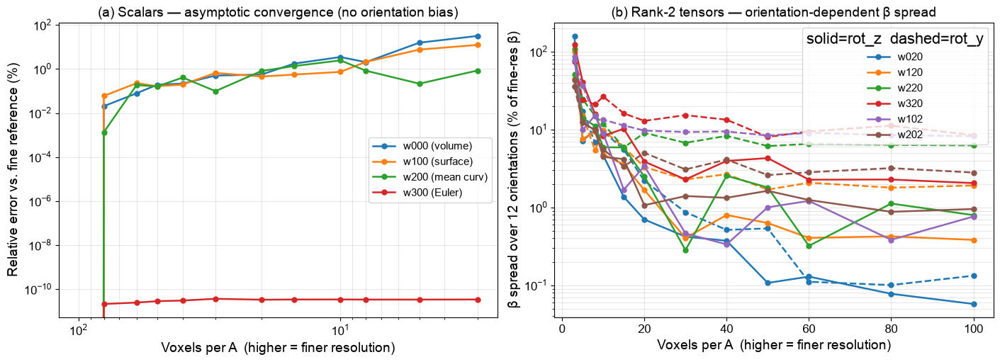

In [12]:
# ── Figure: scalars converge; tensors carry orientation-dependent spread ──────
# Left:  scalar relative error at angle=0 vs. resolution  (protocol-independent)
# Right: tensor β spread (max−min over 12 angles, % of fine-res β) vs. resolution,
#        both protocols shown — solid rot_z, dashed rot_y

SC_LABELS = {'w000': 'w000 (volume)', 'w100': 'w100 (surface)',
             'w200': 'w200 (mean curv)', 'w300': 'w300 (Euler)'}
SC_COLORS = ['#1f77b4', '#ff7f0e', '#2ca02c', '#d62728']
PROT_LS   = {'rot_z': '-', 'rot_y': '--'}

fig, (ax_s, ax_t) = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)

# Panel A — scalar convergence (angle=0, protocol-independent)
for sc, col in zip(('w000','w100','w200','w300'), SC_COLORS):
    ax_s.loglog(DF_CONV['vox_per_A'], DF_CONV[f'{sc}_err'],
                'o-', ms=5, lw=1.8, color=col, label=SC_LABELS[sc])
ax_s.set_xlabel('Voxels per A  (higher = finer resolution)')
ax_s.set_ylabel('Relative error vs. fine reference (%)')
ax_s.set_title('(a) Scalars — asymptotic convergence (no orientation bias)')
ax_s.legend(fontsize=BASE_FONT-5)
ax_s.grid(True, which='both', alpha=0.3)
ax_s.invert_xaxis()

# Panel B — tensor β spread, both protocols
for name, col in zip(RANK2, TENSOR_COLORS):
    ref = FINE_BETA[name]
    for proto in PROTOCOLS:
        DFp     = DF[DF['protocol'] == proto]
        spreads = []
        vpas    = []
        for vox in VOXEL_SIZES:
            sub = DFp[DFp['voxel_size'] == vox]
            bv  = sub[f'{name}_beta']
            spreads.append(100*(bv.max() - bv.min()) / ref)
            vpas.append(int(A / vox))
        label = name if proto == 'rot_z' else None
        ax_t.semilogy(vpas, spreads, 'o' + PROT_LS[proto],
                      ms=5, lw=1.8, color=col, label=label)

ax_t.set_xlabel('Voxels per A  (higher = finer resolution)')
ax_t.set_ylabel('β spread over 12 orientations (% of fine-res β)')
ax_t.set_title('(b) Rank-2 tensors — orientation-dependent β spread')
ax_t.legend(fontsize=BASE_FONT-5, title='solid=rot_z  dashed=rot_y')
ax_t.grid(True, which='both', alpha=0.3)

save_path = os.path.join(RESULTS_DIR, 'orientation_bias.pdf')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved -> {save_path}')
plt.show()

NameError: name 'DF_HI' is not defined

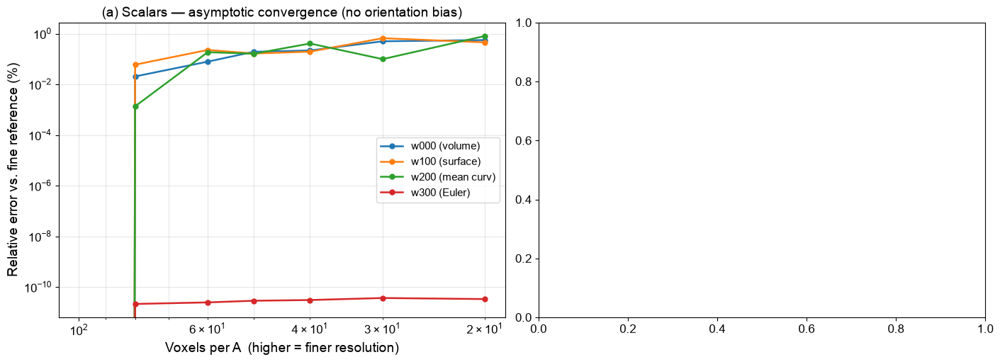

In [13]:
# ── Figure: summary — hi-res only (≥A/20) ────────────────────────────────────
# Same layout as the full-range summary above, restricted to 20–100 vox/A.
DF_CONV_HI = DF_CONV[DF_CONV['vox_per_A'].isin(HIRES_DENOMS)]

fig, (ax_s, ax_t) = plt.subplots(1, 2, figsize=(14, 5), constrained_layout=True)

# Panel A — scalar convergence, hi-res only
for sc, col in zip(('w000','w100','w200','w300'), SC_COLORS):
    ax_s.loglog(DF_CONV_HI['vox_per_A'], DF_CONV_HI[f'{sc}_err'],
                'o-', ms=5, lw=1.8, color=col, label=SC_LABELS[sc])
ax_s.set_xlabel('Voxels per A  (higher = finer resolution)')
ax_s.set_ylabel('Relative error vs. fine reference (%)')
ax_s.set_title('(a) Scalars — asymptotic convergence (no orientation bias)')
ax_s.legend(fontsize=BASE_FONT-5)
ax_s.grid(True, which='both', alpha=0.3)
ax_s.invert_xaxis()

# Panel B — tensor β std, hi-res only, both protocols
for name, col in zip(RANK2, TENSOR_COLORS):
    ref = FINE_BETA[name]
    for proto in PROTOCOLS:
        DFp  = DF_HI[DF_HI['protocol'] == proto]
        stds = []
        vpas = []
        for vox in [v for v in VOXEL_SIZES if int(A/v) in HIRES_DENOMS]:
            sub = DFp[DFp['voxel_size'] == vox]
            stds.append(100 * sub[f'{name}_beta'].std() / ref)
            vpas.append(int(A / vox))
        label = name if proto == 'rot_z' else None
        ax_t.semilogy(vpas, stds, 'o' + PROT_LS[proto],
                      ms=5, lw=1.8, color=col, label=label)

ax_t.set_xlabel('Voxels per A  (higher = finer resolution)')
ax_t.set_ylabel('β std over 12 orientations (% of fine-res β)')
ax_t.set_title('(b) Rank-2 tensors — orientation-dependent β std  [hi-res]')
ax_t.legend(fontsize=BASE_FONT-5, title='solid=rot_z  dashed=rot_y')
ax_t.grid(True, which='both', alpha=0.3)

save_path = os.path.join(RESULTS_DIR, 'orientation_bias_hires.pdf')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved -> {save_path}')
plt.show()

In [ ]:
# ── Figure: β vs resolution, coloured by orientation angle ───────────────────
cmap_ang   = plt.cm.turbo
norm_ang   = plt.Normalize(vmin=0, vmax=165)
ang_colors = [cmap_ang(norm_ang(a)) for a in ANGLES]
_xticks    = [int(A/v) for v in VOXEL_SIZES]

for proto in PROTOCOLS:
    DFp = DF[DF['protocol'] == proto]
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(PROT_LABELS[proto], fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax = axes.flat[idx]
        for ang, col in zip(ANGLES, ang_colors):
            sub = DFp[DFp['angle_deg'] == float(ang)].sort_values('n_vox_A')
            ax.plot(sub['n_vox_A'], sub[f'{name}_beta'],
                    'o-', ms=4, lw=1.2, color=col, alpha=0.85)
        ax.axhline(FINE_BETA[name], color='gray', ls=':', lw=1.5,
                   label=f'fine-res {FINE_BETA[name]:.3f}')
        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Voxels per A')
        ax.set_ylabel('Anisotropy index \u03b2')
        ax.set_xticks(_xticks)
        ax.set_xticklabels(_xticks, fontsize=7, rotation=45)
        ax.legend(loc='best', framealpha=0.85)

    sm = plt.cm.ScalarMappable(cmap=cmap_ang, norm=norm_ang)
    sm.set_array([])
    fig.colorbar(sm, ax=axes.ravel().tolist(), label='Rotation angle (deg)', shrink=0.6)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_beta_vs_res_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

In [ ]:
# ── Figure: β vs resolution (log x), coloured by orientation angle ───────────
for proto in PROTOCOLS:
    DFp = DF[DF['protocol'] == proto]
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(PROT_LABELS[proto], fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax = axes.flat[idx]
        for ang, col in zip(ANGLES, ang_colors):
            sub = DFp[DFp['angle_deg'] == float(ang)].sort_values('n_vox_A')
            ax.plot(sub['n_vox_A'], sub[f'{name}_beta'],
                    'o-', ms=4, lw=1.2, color=col, alpha=0.85)
        ax.axhline(FINE_BETA[name], color='gray', ls=':', lw=1.5,
                   label=f'fine-res {FINE_BETA[name]:.3f}')
        ax.set_xscale('log')
        ax.set_xticks(_xticks)
        ax.xaxis.set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Voxels per A (log scale)')
        ax.set_ylabel('Anisotropy index \u03b2')
        ax.legend(loc='best', framealpha=0.85)

    sm = plt.cm.ScalarMappable(cmap=cmap_ang, norm=norm_ang)
    sm.set_array([])
    fig.colorbar(sm, ax=axes.ravel().tolist(), label='Rotation angle (deg)', shrink=0.6)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_beta_vs_res_log_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

In [ ]:
# ── Figure: bias ± σ shaded band vs resolution ───────────────────────────────
# bias(h)  = mean(β_measured − β_ref) over 12 orientations   [systematic offset]
# σ(h)     = std(β_measured)          over 12 orientations   [oscillation spread]
# β_ref    = FINE_BETA  (fine-resolution reference, A/100)
#
# x: voxels/A (log),  y: β − β_ref (linear)
# shaded band = bias ± σ;  dashed line at 0 = perfect convergence

_vpas_all = [int(A/v) for v in VOXEL_SIZES]

for proto in PROTOCOLS:
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(f'{PROT_LABELS[proto]} — bias & spread vs resolution', fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax  = axes.flat[idx]
        ref = FINE_BETA[name]
        col = TENSOR_COLORS[idx]

        biases = np.array([
            DF[(DF['protocol'] == proto) & (DF['voxel_size'] == vox)
               ][f'{name}_beta'].mean() - ref
            for vox in VOXEL_SIZES
        ])
        sigmas = np.array([
            DF[(DF['protocol'] == proto) & (DF['voxel_size'] == vox)
               ][f'{name}_beta'].std()
            for vox in VOXEL_SIZES
        ])

        ax.axhline(0, color='k', ls='--', lw=1, alpha=0.4, label='bias = 0')
        ax.fill_between(_vpas_all, biases - sigmas, biases + sigmas,
                        alpha=0.20, color=col)
        ax.plot(_vpas_all, biases, 'o-', ms=4, lw=1.5, color=col, label='bias')
        ax.plot(_vpas_all, sigmas,  's:', ms=4, lw=1.2, color=col, alpha=0.8, label='σ')
        ax.set_xscale('log')
        ax.set_xticks(_vpas_all)
        ax.xaxis.set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
        ax.tick_params(axis='x', labelsize=7, rotation=45)
        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Voxels per A (log scale)')
        ax.set_ylabel('β − β_ref')
        ax.legend(loc='best', framealpha=0.85, fontsize=BASE_FONT-6)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_bias_sigma_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

In [ ]:
# ── Figure: power-law convergence — |bias| and σ on log-log, with fitted lines
# Fit on hi-res only (≥A/20) to avoid coarse-grid artefacts.
# bias ~ C·h^p  ↔  |bias| ~ C·(A/n)^p  ↔  log|bias| = const − p·log(n)
# Reported exponent p is the convergence order (higher = faster).

_vpas_arr = np.array([int(A/v) for v in VOXEL_SIZES])
_hi_mask  = np.array([int(A/v) in HIRES_DENOMS for v in VOXEL_SIZES])

def _fit_power(vpas, vals):
    """Fit log(vals) ~ slope*log(vpas) + const; return (p, C) where p = -slope."""
    valid = vals > 1e-12
    if valid.sum() < 3:
        return None, None
    slope, intercept = np.polyfit(np.log(vpas[valid]), np.log(vals[valid]), 1)
    return -slope, np.exp(intercept)   # p = convergence order, C = prefactor

for proto in PROTOCOLS:
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(f'{PROT_LABELS[proto]} — power-law convergence of |bias| and σ',
                 fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax  = axes.flat[idx]
        ref = FINE_BETA[name]
        col = TENSOR_COLORS[idx]

        abs_bias = np.array([
            abs(DF[(DF['protocol'] == proto) & (DF['voxel_size'] == v)
                  ][f'{name}_beta'].mean() - ref)
            for v in VOXEL_SIZES
        ])
        sigmas = np.array([
            DF[(DF['protocol'] == proto) & (DF['voxel_size'] == v)
              ][f'{name}_beta'].std()
            for v in VOXEL_SIZES
        ])

        ax.loglog(_vpas_arr, abs_bias, 'o-',  ms=4, lw=1.5, color=col, label='|bias|')
        ax.loglog(_vpas_arr, sigmas,   's--', ms=4, lw=1.5, color=col, alpha=0.7, label='σ')

        # power-law fits on hi-res range
        vpa_hi  = _vpas_arr[_hi_mask]
        vpa_fit = np.logspace(np.log10(vpa_hi.min()), np.log10(vpa_hi.max()), 60)

        p_b, C_b = _fit_power(_vpas_arr[_hi_mask], abs_bias[_hi_mask])
        p_s, C_s = _fit_power(_vpas_arr[_hi_mask], sigmas[_hi_mask])

        if p_b is not None:
            ax.loglog(vpa_fit, C_b * vpa_fit**(-p_b), '-',  lw=1.2, color=col,
                      alpha=0.45, label=f'fit |bias|: p={p_b:.2f}')
        if p_s is not None:
            ax.loglog(vpa_fit, C_s * vpa_fit**(-p_s), '--', lw=1.2, color=col,
                      alpha=0.45, label=f'fit σ: p={p_s:.2f}')

        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Voxels per A')
        ax.set_ylabel('β error (log scale)')
        ax.legend(loc='best', framealpha=0.85, fontsize=BASE_FONT-6)
        ax.grid(True, which='both', alpha=0.3)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_powerlaw_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_scalars_vs_res.pdf


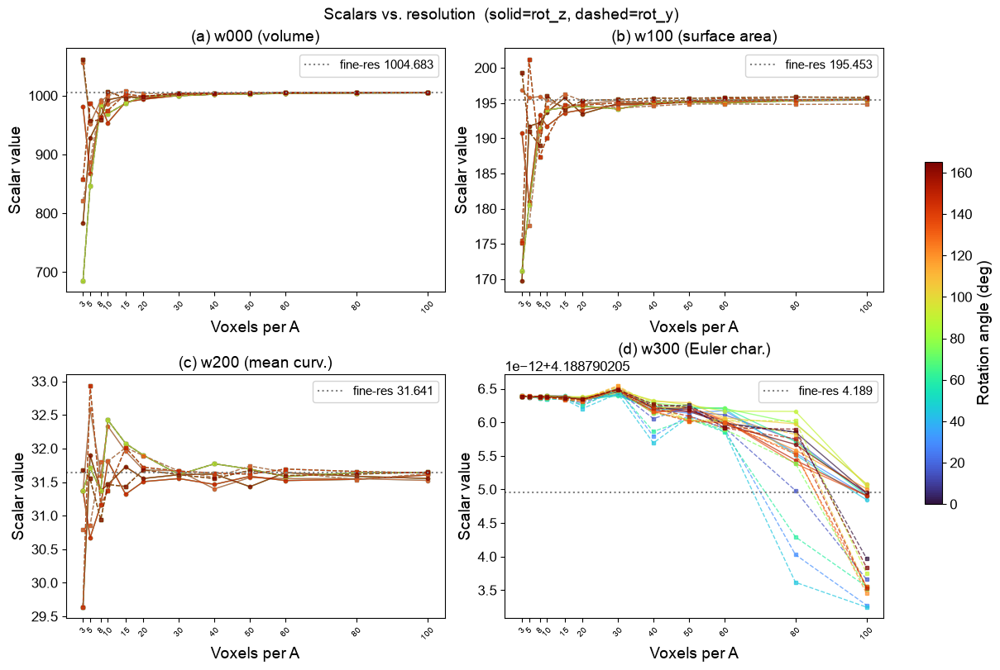

In [ ]:
# ── Figure: scalars vs. resolution — both protocols overlaid ─────────────────
# Scalars have no orientation bias so protocols overlap; showing both confirms this.
# solid o- = rot_z,  dashed s-- = rot_y
SC_TITLES = {
    'w000': 'w000 (volume)',
    'w100': 'w100 (surface area)',
    'w200': 'w200 (mean curv.)',
    'w300': 'w300 (Euler char.)',
}

fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)

for idx, sc in enumerate(['w000', 'w100', 'w200', 'w300']):
    ax = axes.flat[idx]
    for proto, mk in [('rot_z', 'o-'), ('rot_y', 's--')]:
        DFp = DF[DF['protocol'] == proto]
        for ang, col in zip(ANGLES, ang_colors):
            sub = DFp[DFp['angle_deg'] == float(ang)].sort_values('n_vox_A')
            ax.plot(sub['n_vox_A'], sub[sc], mk, ms=3, lw=1.0, color=col, alpha=0.7)
    ax.axhline(FINE_SCALARS[sc], color='gray', ls=':', lw=1.5,
               label=f'fine-res {FINE_SCALARS[sc]:.3f}')
    ax.set_title(f'({chr(97+idx)}) {SC_TITLES[sc]}')
    ax.set_xlabel('Voxels per A')
    ax.set_ylabel('Scalar value')
    ax.set_xticks(_xticks)
    ax.set_xticklabels(_xticks, fontsize=7, rotation=45)
    ax.legend(loc='best', framealpha=0.85)

sm = plt.cm.ScalarMappable(cmap=cmap_ang, norm=norm_ang)
sm.set_array([])
fig.colorbar(sm, ax=axes.ravel().tolist(), label='Rotation angle (deg)', shrink=0.6)
fig.suptitle('Scalars vs. resolution  (solid=rot_z, dashed=rot_y)', fontsize=BASE_FONT-2)

save_path = os.path.join(RESULTS_DIR, 'orientation_bias_scalars_vs_res.pdf')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved -> {save_path}')
plt.show()

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_scalars_vs_res_log.pdf


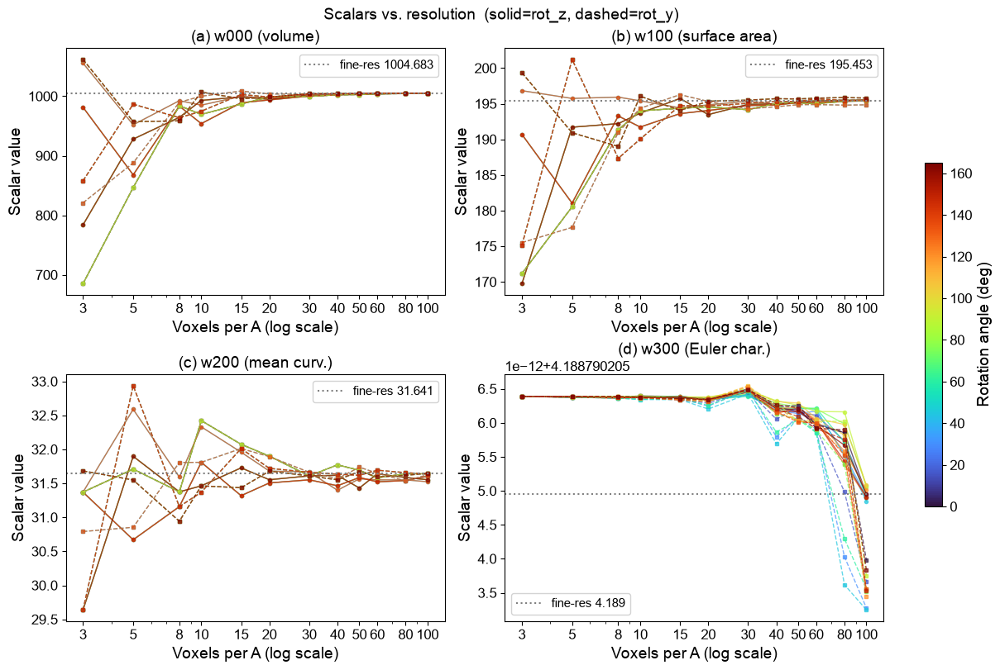

In [ ]:
# ── Figure: scalars vs. resolution (log x) — both protocols overlaid ─────────
fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)

for idx, sc in enumerate(['w000', 'w100', 'w200', 'w300']):
    ax = axes.flat[idx]
    for proto, mk in [('rot_z', 'o-'), ('rot_y', 's--')]:
        DFp = DF[DF['protocol'] == proto]
        for ang, col in zip(ANGLES, ang_colors):
            sub = DFp[DFp['angle_deg'] == float(ang)].sort_values('n_vox_A')
            ax.plot(sub['n_vox_A'], sub[sc], mk, ms=3, lw=1.0, color=col, alpha=0.7)
    ax.axhline(FINE_SCALARS[sc], color='gray', ls=':', lw=1.5,
               label=f'fine-res {FINE_SCALARS[sc]:.3f}')
    ax.set_xscale('log')
    ax.set_xticks(_xticks)
    ax.xaxis.set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
    ax.set_title(f'({chr(97+idx)}) {SC_TITLES[sc]}')
    ax.set_xlabel('Voxels per A (log scale)')
    ax.set_ylabel('Scalar value')
    ax.legend(loc='best', framealpha=0.85)

sm = plt.cm.ScalarMappable(cmap=cmap_ang, norm=norm_ang)
sm.set_array([])
fig.colorbar(sm, ax=axes.ravel().tolist(), label='Rotation angle (deg)', shrink=0.6)
fig.suptitle('Scalars vs. resolution  (solid=rot_z, dashed=rot_y)', fontsize=BASE_FONT-2)

save_path = os.path.join(RESULTS_DIR, 'orientation_bias_scalars_vs_res_log.pdf')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved -> {save_path}')
plt.show()

In [ ]:
# ── Figure: β vs resolution — hi-res only (≥A/20), linear x ─────────────────
_xticks_hi = HIRES_DENOMS

for proto in PROTOCOLS:
    DFp = DF_HI[DF_HI['protocol'] == proto]
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(f'{PROT_LABELS[proto]}  — hi-res only', fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax = axes.flat[idx]
        for ang, col in zip(ANGLES, ang_colors):
            sub = DFp[DFp['angle_deg'] == float(ang)].sort_values('n_vox_A')
            ax.plot(sub['n_vox_A'], sub[f'{name}_beta'],
                    'o-', ms=4, lw=1.2, color=col, alpha=0.85)
        ax.axhline(FINE_BETA[name], color='gray', ls=':', lw=1.5,
                   label=f'fine-res {FINE_BETA[name]:.3f}')
        ax.set_xticks(_xticks_hi)
        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Voxels per A')
        ax.set_ylabel('Anisotropy index \u03b2')
        ax.legend(loc='best', framealpha=0.85)

    sm = plt.cm.ScalarMappable(cmap=cmap_ang, norm=norm_ang)
    sm.set_array([])
    fig.colorbar(sm, ax=axes.ravel().tolist(), label='Rotation angle (deg)', shrink=0.6)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_beta_hires_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

In [ ]:
# ── Figure: β vs resolution — hi-res only (≥A/20), log x ────────────────────
for proto in PROTOCOLS:
    DFp = DF_HI[DF_HI['protocol'] == proto]
    fig, axes = plt.subplots(2, 3, figsize=(16, 9), constrained_layout=True)
    fig.suptitle(f'{PROT_LABELS[proto]}  — hi-res only', fontsize=BASE_FONT)

    for idx, name in enumerate(RANK2):
        ax = axes.flat[idx]
        for ang, col in zip(ANGLES, ang_colors):
            sub = DFp[DFp['angle_deg'] == float(ang)].sort_values('n_vox_A')
            ax.plot(sub['n_vox_A'], sub[f'{name}_beta'],
                    'o-', ms=4, lw=1.2, color=col, alpha=0.85)
        ax.axhline(FINE_BETA[name], color='gray', ls=':', lw=1.5,
                   label=f'fine-res {FINE_BETA[name]:.3f}')
        ax.set_xscale('log')
        ax.set_xticks(_xticks_hi)
        ax.xaxis.set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
        ax.set_title(f'({chr(97+idx)}) {name}')
        ax.set_xlabel('Voxels per A (log scale)')
        ax.set_ylabel('Anisotropy index \u03b2')
        ax.legend(loc='best', framealpha=0.85)

    sm = plt.cm.ScalarMappable(cmap=cmap_ang, norm=norm_ang)
    sm.set_array([])
    fig.colorbar(sm, ax=axes.ravel().tolist(), label='Rotation angle (deg)', shrink=0.6)

    save_path = os.path.join(RESULTS_DIR, f'orientation_bias_beta_hires_log_{proto}.pdf')
    plt.savefig(save_path, dpi=150, bbox_inches='tight')
    print(f'Saved -> {save_path}')
    plt.show()

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_scalars_hires.pdf


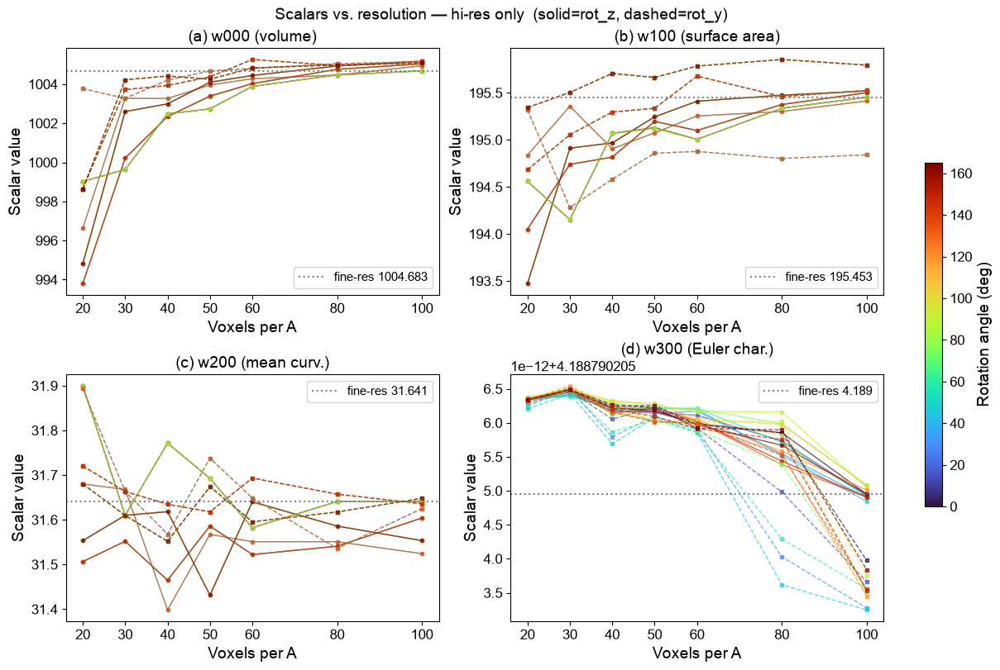

In [ ]:
# ── Figure: scalars vs. resolution — hi-res only (≥A/20), both protocols ─────
# solid o- = rot_z,  dashed s-- = rot_y
fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)

for idx, sc in enumerate(['w000', 'w100', 'w200', 'w300']):
    ax = axes.flat[idx]
    for proto, mk in [('rot_z', 'o-'), ('rot_y', 's--')]:
        DFp = DF_HI[DF_HI['protocol'] == proto]
        for ang, col in zip(ANGLES, ang_colors):
            sub = DFp[DFp['angle_deg'] == float(ang)].sort_values('n_vox_A')
            ax.plot(sub['n_vox_A'], sub[sc], mk, ms=3, lw=1.0, color=col, alpha=0.7)
    ax.axhline(FINE_SCALARS[sc], color='gray', ls=':', lw=1.5,
               label=f'fine-res {FINE_SCALARS[sc]:.3f}')
    ax.set_xticks(_xticks_hi)
    ax.set_title(f'({chr(97+idx)}) {SC_TITLES[sc]}')
    ax.set_xlabel('Voxels per A')
    ax.set_ylabel('Scalar value')
    ax.legend(loc='best', framealpha=0.85)

sm = plt.cm.ScalarMappable(cmap=cmap_ang, norm=norm_ang)
sm.set_array([])
fig.colorbar(sm, ax=axes.ravel().tolist(), label='Rotation angle (deg)', shrink=0.6)
fig.suptitle('Scalars vs. resolution — hi-res only  (solid=rot_z, dashed=rot_y)',
             fontsize=BASE_FONT-2)

save_path = os.path.join(RESULTS_DIR, 'orientation_bias_scalars_hires.pdf')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved -> {save_path}')
plt.show()

Saved -> /Users/yk/Desktop/pykarambola_m1/pykarambola/paper/notebooks/results/orientation_bias_scalars_hires_log.pdf


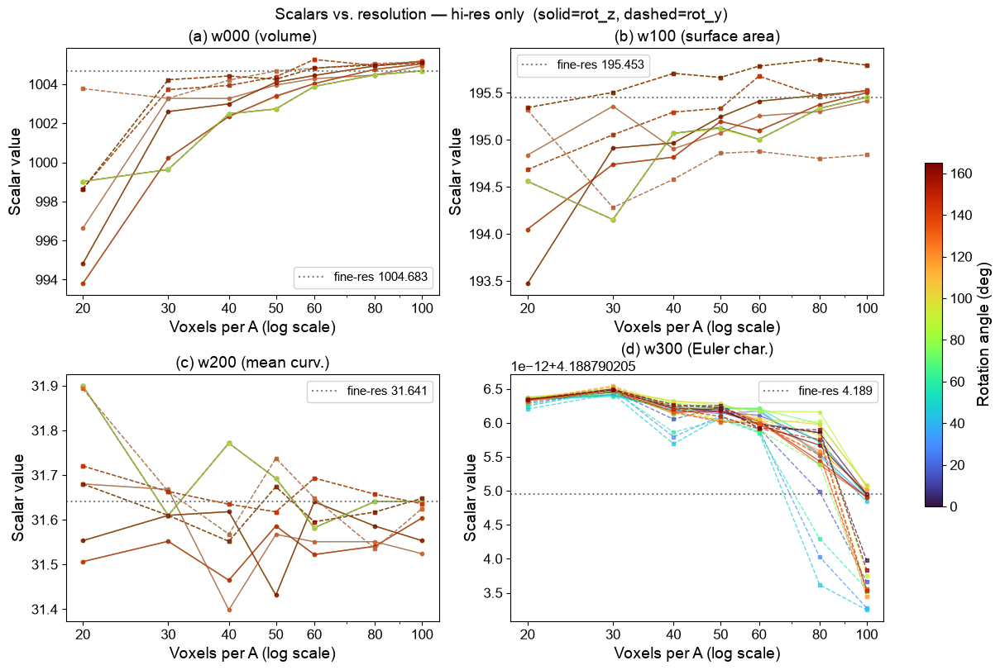

In [ ]:
# ── Figure: scalars vs. resolution — hi-res only (≥A/20), log x ─────────────
fig, axes = plt.subplots(2, 2, figsize=(12, 8), constrained_layout=True)

for idx, sc in enumerate(['w000', 'w100', 'w200', 'w300']):
    ax = axes.flat[idx]
    for proto, mk in [('rot_z', 'o-'), ('rot_y', 's--')]:
        DFp = DF_HI[DF_HI['protocol'] == proto]
        for ang, col in zip(ANGLES, ang_colors):
            sub = DFp[DFp['angle_deg'] == float(ang)].sort_values('n_vox_A')
            ax.plot(sub['n_vox_A'], sub[sc], mk, ms=3, lw=1.0, color=col, alpha=0.7)
    ax.axhline(FINE_SCALARS[sc], color='gray', ls=':', lw=1.5,
               label=f'fine-res {FINE_SCALARS[sc]:.3f}')
    ax.set_xscale('log')
    ax.set_xticks(_xticks_hi)
    ax.xaxis.set_major_formatter(plt.matplotlib.ticker.ScalarFormatter())
    ax.set_title(f'({chr(97+idx)}) {SC_TITLES[sc]}')
    ax.set_xlabel('Voxels per A (log scale)')
    ax.set_ylabel('Scalar value')
    ax.legend(loc='best', framealpha=0.85)

sm = plt.cm.ScalarMappable(cmap=cmap_ang, norm=norm_ang)
sm.set_array([])
fig.colorbar(sm, ax=axes.ravel().tolist(), label='Rotation angle (deg)', shrink=0.6)
fig.suptitle('Scalars vs. resolution — hi-res only  (solid=rot_z, dashed=rot_y)',
             fontsize=BASE_FONT-2)

save_path = os.path.join(RESULTS_DIR, 'orientation_bias_scalars_hires_log.pdf')
plt.savefig(save_path, dpi=150, bbox_inches='tight')
print(f'Saved -> {save_path}')
plt.show()

In [ ]:
# ── Parametric UV mesh generation — make_ellipsoid_off ───────────────────────
#
# Builds watertight UV-triangulated ellipsoid meshes in OFF format.
# These are the analytical (non-voxelised) reference meshes used in the
# ellipsoid_mesh_test notebook (archived at tag marching-cube-based-deviation).
#
# Vertex layout:
#   indices 0 … N_u*N_v-1  : ring vertices, row-major (u_i, v_j) → i*N_v + j
#   index   N_u*N_v         : north pole  (0, 0,  C)
#   index   N_u*N_v + 1     : south pole  (0, 0, -C)
#
# v is sampled strictly inside (0, π) to avoid degenerate ring vertices;
# the poles are added as single dedicated vertices and connected via fan
# triangles so the mesh is closed (watertight) → w000 is well-defined.
#
# Winding convention: outward-pointing normals (right-hand rule, CCW from outside).
# The parametric cross product r_u × r_v points INWARD for this UV parametrisation,
# so quads are wound (v00, v11, v10) / (v00, v01, v11) (reversed from naive order).
#
# OFF format:
#   OFF
#   <n_verts> <n_faces> 0
#   x y z           (one per vertex)
#   3 v0 v1 v2      (one per triangle)

# UV mesh resolutions: (N_u, N_v) = (longitudes, latitude rings excl. poles)
# Two additional pole vertices are added per mesh to make it watertight.
RESOLUTIONS = [
    ( 50,   26, 'coarse'),
    (200,  101, 'medium'),
    (500,  251, 'fine'),
]

MESH_DIR = '/tmp/ellipsoid_mesh_test'
os.makedirs(MESH_DIR, exist_ok=True)


def make_ellipsoid_off(lx, ly, lz, N_u, N_v, filepath):
    """Build a closed UV-triangulated ellipsoid and write it as an OFF file."""
    u = np.linspace(0, 2*np.pi, N_u, endpoint=False)      # N_u longitudes
    v = np.linspace(np.pi / (N_v + 1),                     # avoid exact poles
                    np.pi * N_v / (N_v + 1),
                    N_v)
    U, V = np.meshgrid(u, v, indexing='ij')               # shape (N_u, N_v)

    # Ring vertices
    ring_verts = np.column_stack([
        lx * np.cos(U).ravel() * np.sin(V).ravel(),
        ly * np.sin(U).ravel() * np.sin(V).ravel(),
        lz * np.cos(V).ravel(),
    ])  # shape (N_u*N_v, 3)

    # Pole vertices
    north_idx = N_u * N_v
    south_idx = N_u * N_v + 1
    pole_verts = np.array([[0.0, 0.0, lz],    # north pole
                           [0.0, 0.0, -lz]])  # south pole

    verts = np.vstack([ring_verts, pole_verts])
    faces = []

    # ── Interior quads (wound for outward normals) ──────────────────────────
    for i in range(N_u):
        i_next = (i + 1) % N_u
        for j in range(N_v - 1):
            v00 = i      * N_v + j
            v10 = i_next * N_v + j
            v01 = i      * N_v + (j + 1)
            v11 = i_next * N_v + (j + 1)
            # Reversed winding: r_u×r_v points inward, so flip to get outward
            faces.append((v00, v11, v10))
            faces.append((v00, v01, v11))

    # ── North pole cap ──────────────────────────────────────────────────────
    # Top ring: j=0, vertices at v = v[0]  (near north pole)
    # Viewed from outside (above), u increases CCW → wind (north, v_i, v_{i+1}) = outward
    for i in range(N_u):
        i_next  = (i + 1) % N_u
        vi      = i      * N_v + 0
        vi_next = i_next * N_v + 0
        faces.append((north_idx, vi, vi_next))

    # ── South pole cap ──────────────────────────────────────────────────────
    # Bottom ring: j=N_v-1, vertices at v = v[-1]  (near south pole)
    # Viewed from outside (below), u increases CW → wind (south, v_{i+1}, v_i) = outward
    for i in range(N_u):
        i_next  = (i + 1) % N_u
        vi      = i      * N_v + (N_v - 1)
        vi_next = i_next * N_v + (N_v - 1)
        faces.append((south_idx, vi_next, vi))

    faces = np.array(faces, dtype=np.int32)
    n_v, n_f = len(verts), len(faces)

    with open(filepath, 'w') as fh:
        fh.write('OFF\n')
        fh.write(f'{n_v} {n_f} 0\n')
        for x, y, z in verts:
            fh.write(f'{x:.10f} {y:.10f} {z:.10f}\n')
        for f0, f1, f2 in faces:
            fh.write(f'3 {f0} {f1} {f2}\n')

    return filepath, n_v, n_f


# ── Build and save meshes ─────────────────────────────────────────────────────
OFF_FILES = {}
print(f'Ellipsoid semi-axes : A={A}, B={B}, C={C}')
print(f'Mesh directory      : {MESH_DIR}')
print()
print('Building ellipsoid meshes ...')
for Nu, Nv, label in RESOLUTIONS:
    path = os.path.join(MESH_DIR, f'ellipsoid_Nu{Nu}_Nv{Nv}.off')
    _, nv, nf = make_ellipsoid_off(A, B, C, Nu, Nv, path)
    OFF_FILES[label] = path
    print(f'  {label:8s}: {nv:,} verts, {nf:,} faces  →  {path}')

print('\nDone.  Files saved to', MESH_DIR)